In [1]:
import os

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
!pip install opencv-python

In [3]:
!ls tmp/bicycle_image_metric_learning_v2

images    test.csv  train.csv


In [4]:
!ls -l tmp/bicycle_image_metric_learning_v2/images | wc -l

    8314


In [5]:
im_dir = 'tmp/bicycle_image_metric_learning_v2/images'

In [6]:
d_train = pd.read_csv('tmp/bicycle_image_metric_learning_v2/train.csv')
d_test = pd.read_csv('tmp/bicycle_image_metric_learning_v2/test.csv')
d_train.shape, d_test.shape

((6650, 3), (1663, 3))

In [7]:
d_train.head()

,image,label,fold
0,181783211141_0.JPG,181783211141,0
1,181596348104_1.JPG,181596348104,2
2,171166528893_0.JPG,171166528893,0
3,191638747719_10.JPG,191638747719,0
4,281754899566_1.JPG,281754899566,2


In [8]:
d_train['fold'].value_counts()

2    1663
3    1663
0    1662
1    1662
Name: fold, dtype: int64

In [9]:
d_train['label'].nunique()

918

In [10]:
d_train['label'].value_counts()

351470664875    12
191644245488    12
151735821027    12
151743932677    12
141728823985    12
                ..
381346290146     2
281671184293     2
121505320217     2
111469262153     2
261977438023     2
Name: label, Length: 918, dtype: int64

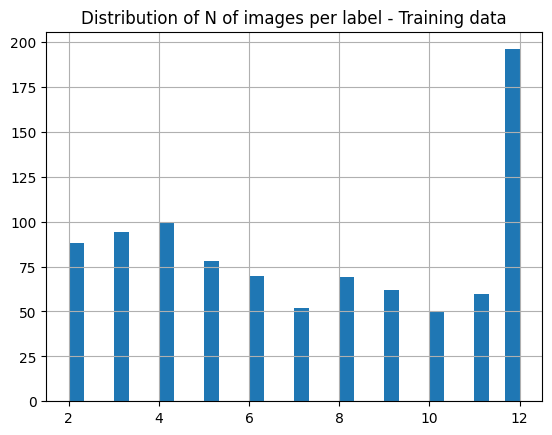

In [11]:
d_train['label'].value_counts().hist(bins=30)
plt.title('Distribution of N of images per label - Training data')
plt.show()

In [12]:
d_train['label'].value_counts().describe()

count    918.000000
mean       7.244009
std        3.548902
min        2.000000
25%        4.000000
50%        7.000000
75%       11.000000
max       12.000000
Name: label, dtype: float64

In [13]:
d_test.head()

,image,label,fold
0,151414046745_8.JPG,151414046745,4
1,251747828037_1.JPG,251747828037,4
2,400957457012_3.JPG,400957457012,4
3,111733215174_2.JPG,111733215174,4
4,131567176523_4.JPG,131567176523,4


In [14]:
d_test['label'].nunique()

230

In [15]:
d_test['label'].value_counts()

321777144199    12
400967051191    12
261989865190    12
321809406702    12
400966173731    12
                ..
201399657790     2
271737553695     2
151687061385     2
121707552581     2
351097439926     2
Name: label, Length: 230, dtype: int64

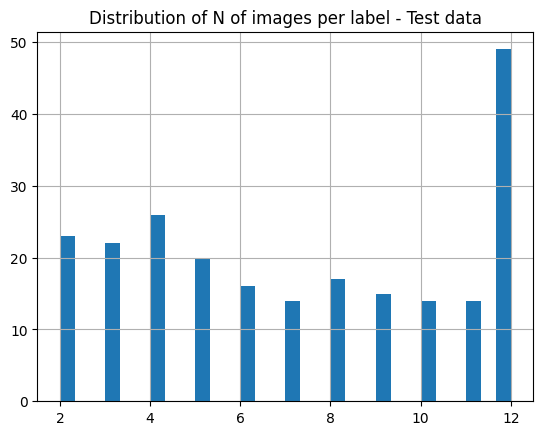

In [16]:
d_test['label'].value_counts().hist(bins=30)
plt.title('Distribution of N of images per label - Test data')
plt.show()

In [17]:
d_test['label'].value_counts().describe()

count    230.000000
mean       7.230435
std        3.556645
min        2.000000
25%        4.000000
50%        7.000000
75%       11.000000
max       12.000000
Name: label, dtype: float64

### labelの重複確認

In [18]:
# 学習データのみにあるlabel数
len(set(d_train['label']) - set(d_test['label']))

918

In [19]:
d_train['label'].nunique()

918

In [20]:
# テストデータのみにあるlabel数
len(set(d_test['label']) - set(d_train['label']))

230

In [21]:
d_test['label'].nunique()

230

-> 学習もテストもlabelの重複なし。テストデータは完全に学習データ外サンプル

In [22]:
# 学習データのfold間重複確認
d_train[d_train['fold']==0]['label'].nunique(), d_train[d_train['fold']==1]['label'].nunique(), d_train[d_train['fold']==2]['label'].nunique(), d_train[d_train['fold']==3]['label'].nunique()

(229, 229, 230, 230)

In [23]:
229 + 229 + 230 + 230

918

-> 学習データのfold間もlabelの重複なし

### 画像サイズ統計量

- 学習データ

In [24]:
H, W, C = [], [], []
v_mean, v_min, v_max = [], [], []
im_pathes = []
for f in d_train['image']:
    im_path = os.path.join(im_dir, f)
    im_pathes.append(im_path)
    im = cv2.imread(im_path)
    H.append(im.shape[0])
    W.append(im.shape[1])
    C.append(im.shape[2])
    v_mean.append(im.mean())
    v_min.append(im.min()*1.0)
    v_max.append(im.max()*1.0)
df_train_shape = pd.DataFrame({'H':H, 'W':W, 'C':C, 'val_mean':v_mean, 'val_min':v_min, 'val_max':v_max})
df_train_shape.shape

(6650, 6)

In [25]:
df_train_shape

,H,W,C,val_mean,val_min,val_max
0,304,500,3,207.828730,0.0,255.0
1,500,500,3,188.260181,0.0,255.0
2,400,400,3,226.623998,0.0,255.0
3,400,300,3,129.550200,0.0,255.0
4,288,500,3,118.795796,0.0,255.0
...,...,...,...,...,...,...
6645,300,400,3,121.201906,0.0,255.0
6646,500,375,3,84.392626,0.0,255.0
6647,400,400,3,127.594175,0.0,255.0
6648,333,500,3,128.286569,12.0,255.0


In [26]:
df_train_shape.describe()

,H,W,C,val_mean,val_min,val_max
count,6650.000000,6650.000000,6650.0,6650.000000,6650.000000,6650.000000
mean,346.135940,416.920902,3.0,143.546719,0.471579,254.763008
std,88.308974,86.147960,0.0,46.318940,2.947149,3.136502
min,80.000000,80.000000,3.0,18.065401,0.000000,167.000000
25%,300.000000,400.000000,3.0,109.790401,0.000000,255.000000
50%,308.000000,400.000000,3.0,130.525135,0.000000,255.000000
75%,400.000000,500.000000,3.0,177.806805,0.000000,255.000000
max,1500.000000,2894.000000,3.0,247.304681,92.000000,255.000000


[H, W, C] = [[80,1500], [80,2894], 3]

- テストデータ

In [27]:
H, W, C = [], [], []
v_mean, v_min, v_max = [], [], []
im_pathes = []
for f in d_test['image']:
    im_path = os.path.join(im_dir, f)
    im_pathes.append(im_path)
    im = cv2.imread(im_path)
    H.append(im.shape[0])
    W.append(im.shape[1])
    C.append(im.shape[2])
    v_mean.append(im.mean())
    v_min.append(im.min()*1.0)
    v_max.append(im.max()*1.0)
df_test_shape = pd.DataFrame({'H':H, 'W':W, 'C':C, 'val_mean':v_mean, 'val_min':v_min, 'val_max':v_max})
df_test_shape.shape

(1663, 6)

In [28]:
df_test_shape

,H,W,C,val_mean,val_min,val_max
0,400,400,3,194.996448,0.0,255.0
1,400,400,3,224.826342,0.0,255.0
2,225,400,3,136.416219,0.0,255.0
3,300,400,3,149.010469,0.0,255.0
4,334,500,3,151.345291,0.0,255.0
...,...,...,...,...,...,...
1658,260,400,3,191.066679,0.0,255.0
1659,266,400,3,109.363477,0.0,255.0
1660,300,400,3,115.145061,0.0,255.0
1661,265,400,3,99.403579,0.0,255.0


In [29]:
df_test_shape.describe()

,H,W,C,val_mean,val_min,val_max
count,1663.000000,1663.000000,1663.0,1663.000000,1663.000000,1663.000000
mean,340.488274,416.945280,3.0,145.961863,0.508719,254.898978
std,76.628574,59.665665,0.0,47.757002,3.654911,2.071384
min,63.000000,123.000000,3.0,19.423467,0.000000,194.000000
25%,299.500000,400.000000,3.0,110.871078,0.000000,255.000000
50%,302.000000,400.000000,3.0,134.069200,0.000000,255.000000
75%,400.000000,500.000000,3.0,186.475151,0.000000,255.000000
max,500.000000,500.000000,3.0,249.866469,113.000000,255.000000


[H, W, C] = [[63,500], [123,500], 3]

### 画像の表示

In [30]:
d_train

,image,label,fold
0,181783211141_0.JPG,181783211141,0
1,181596348104_1.JPG,181596348104,2
2,171166528893_0.JPG,171166528893,0
3,191638747719_10.JPG,191638747719,0
4,281754899566_1.JPG,281754899566,2
...,...,...,...
6645,171871365285_7.JPG,171871365285,2
6646,252012535151_8.JPG,252012535151,0
6647,121706104732_3.JPG,121706104732,3
6648,191646000094_7.JPG,191646000094,2


In [31]:
d_train['label'].nunique()

918

In [32]:
# 画像が10枚以上あるlabelを抽出
labels = (d_train['label'].value_counts()[d_train['label'].value_counts() >= 10]).index.values
len(labels)

306

In [35]:
# {size}種類(label)をランダムで選択
size = 3
d = d_train[d_train['label'].isin(np.random.choice(labels, size=size))]
d

,image,label,fold
157,141734532106_2.JPG,141734532106,2
540,231639874766_8.JPG,231639874766,2
541,231639874766_9.JPG,231639874766,2
623,141734532106_9.JPG,141734532106,2
908,231639874766_7.JPG,231639874766,2
1176,231639874766_0.JPG,231639874766,2
1575,231639874766_2.JPG,231639874766,2
1664,281763568871_1.JPG,281763568871,3
2324,281763568871_8.JPG,281763568871,3
2368,281763568871_9.JPG,281763568871,3


In [36]:
d['label'].value_counts()

281763568871    12
231639874766    11
141734532106    10
Name: label, dtype: int64

[141734532106, 231639874766, 281763568871]


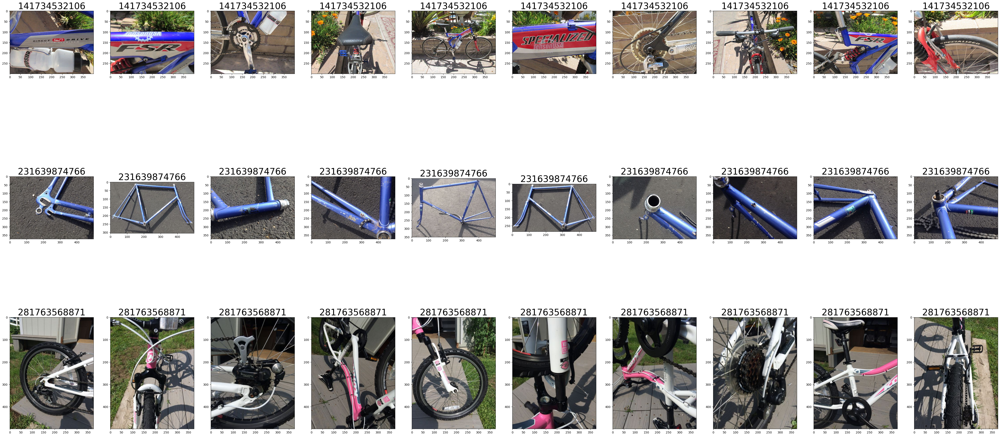

In [37]:
# ランダムにLabel別画像を表示

### ランダムサンプリング
sample_img_path = {}   # label:image_path 形式で表示データを保存
keys = d['label'].unique().tolist()
print(keys)
N = 10   # num of samples from each class

sampled_images = d.groupby('label').apply(lambda x: x.sample(n=N))   # ランダムにサンンプリング


for k in keys:
    tmp = sampled_images[sampled_images['label']==k]['image']
    sample_img_path[k] = [os.path.join('tmp', 'bicycle_image_metric_learning_v2', 'images', i) for i in tmp]
#sample_img_path

### プロット
fig = plt.figure(figsize=(60, 150))
counter = 1
for k in sample_img_path.keys():
    #print(k)
    for v in sample_img_path[k]:
        #print(v)
        #print(counter)
        ax = fig.add_subplot(15, N, counter)
        ax.set_title(k, fontsize=30)
        im = cv2.imread(v)
        converted_im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        plt.imshow(converted_im)
        counter = counter + 1
#plt.savefig("sample_images.png")